<h1 style="text-align: center; color: #8D7334; font-weight: bold; font-style: italic; text-decoration: underline; "> Changing Styles of Photos to Monet's painting with GAN</h1>

<h2 style="text-align: center;  font-weight: bold; font-style: italic; text-decoration: underline; ">  University of Colorado Boulder </h2>
<h2 style="text-align: center;  font-weight: bold; font-style: italic; text-decoration: underline; ">  Master of Data Science </h2>
<h2 style="text-align: center;  font-weight: bold; font-style: italic; text-decoration: underline; ">  DTSA 5511 Introduction to Deep Learning -- Week 5 -- Final Project -- </h2>
<br>
<br>
<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> Introduction and Key Objectives:</h3>

The main objective of this project is to use Generative Adversarial Networks techniques (GAN) to change the style of 7000+ photos to Monet's painting style.  

Generative Adversarial Networks (GANs) are unsupervised machine learning frameworks with at least two neural networks, the generator and the discriminator, which compete in a zero-sum game. The generator creates data that similar to the original real data, in this case paintings, and the discriminator tries to distinguish original real data from the generator's engineered data.

The generator's and discriminator's architectures take the form of a Convolutional Neural Network (CNN), which do a great job at identifying patterns.
The game starts with the generator creating engineered images, intended to resemble the original real data in the training set. The discriminator receives both real data (from the training set) and the engineered data (from the generator), and learns to classify each as real or not real.

The two networks are trained together. The generator improves at creating more convincing data, similar to the original, while the discriminator becomes better at detecting engineered data.
Backpropagation ensures that both networks are optimized. This adversarial process continues until the discriminator can no longer reliably tell the difference between real and generated data. At this stage, the GAN is well-trained.

GANs are widely used for generating realistic images, augmenting datasets, image-to-image translation, and more. One of their main features is their ability to learn without needing labeled data, which makes them a powerful unsupervised learning tool for generating new (synthetic/engineered/generated) data that is statistically similar to real-world samples.

GAN is developing rapidly and there are many types: Vanilla GANs, Conditional cGANs, Deep Convolutional DCGANs, Style GANs, Cycle GANs, Laplacian pyrmamid GANs, DiscoGANs.

https://www.ibm.com/think/topics/generative-adversarial-networks

This video by Martin Keen (IBM) explains GANs very well:

https://www.youtube.com/watch?v=TpMIssRdhco

I started with a simple development of a DCGan, which takes random noise and converts it into a Monet-style picture. The final output is still a random picture (noise), however, the output resembles a monet-style painting (of noise). DCGan is a good way to start learning GAN architecture, but it is not able to take a photo as an input; it only takes random noise as an input. I adpated the code for the DCGAN from this tutorial:

https://www.tensorflow.org/tutorials/generative/dcgan

The model takes multiple hours to train (in my CPU), and eventually delivers monet-style noise pictures. I do not present DCGAN code or results as part of this assignment.

Once I understood the mechanics, I moved to a cycleGAN which can take photos as inputs, and turn them into monet-style pictures.
The model loads Monet original pictures and photo images from data/monet_jpg and data/photos_jpg, trains CycleGAN for photo / Monet translation, converts all images from data/photos_jpg to Monet style using the generator, and the Monet-style images inside generated_images.zip.

I adapted the code from TensorFlow official Pix2Pix/CycleGAN tutorial and used https://www.tensorflow.org/tutorials/generative/pix2pix, and perplexity.ai as resources to tailor, customize, save on disk, and evaluate the model to fit the specific needs of this assignment, and to avoid having to repeat the long training hours. The training took 8 hours on my CPU, and the results were good: the original sharp vivid photos turned into more blur pictures resembling Monet-style paintings to the naked eye of the non-expert.

The metrics for the evaluation on this project is MiFID. 

https://www.kaggle.com/code/wendykan/demo-mifid-metric-for-dog-image-generation-comp


MiFID requires torch tensors as inputs. This piece got a bit messy since I based my code on tensorFlow, NumPy and PIL images. I solved it with an added a conversion in the end, however, the computation of MiFID for 7000+ images takes significant run-time to complete. I saved the MiFID metric result for future reference.

The related Kaggle competition and datset may be found in this link: https://www.kaggle.com/competitions/gan-getting-started



<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> Import Packages: </h3>

In [49]:
import os
import glob
import random
import numpy as np
from datetime import datetime
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import zipfile
import time

#Evaluate performance:
#%pip install torch
#%pip install torchvision
#%pip install torchmetrics
import torch
from torchvision import transforms
from torchmetrics.image.mifid import MemorizationInformedFrechetInceptionDistance



<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> Description of the dataset, Data Cleaning, Preprocessing, and EDA: </h3>

The dataset is split in two directories: the monet_jpg directory with 300 .jpg files of Monet paintings, and the photos_jpg directory with 7,038 .jpg pictures for which the style needs to be converted to Monet's. The converted images with Monet style are saved in generatedImages with image size 256x256x3(RGB) and zipped into one .zip file (images.zip) for delivery.

Each image is of the format 256 x 256 x 3 (RGB)

Let's take a look at the structure of a real Monet picture:



Number of Monet images found: 300

Line 100 Sample Image Name: 7cb36714d0.jpg

Line101 Image shape (HxWxC): (256, 256, 3)


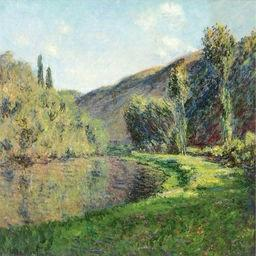

In [50]:
dataDir = os.path.join(os.getcwd(), "data")
#print("\nLine 37 data dir:", dataDir)
monetDir = os.path.join(dataDir, 'monet_jpg')
photoDir = os.path.join(dataDir, 'photo_jpg')
imgHeight, imgWidth, imgChannels = 256, 256, 3
batchSize = 10
bufferSize = 1000
epochs = 120
#print("\nLine 45 data dir:", photoDir)

def loadImage(path):
        img = Image.open(path).convert('RGB')
        img = img.resize((imgWidth, imgHeight))
        imgArr = np.array(img) / 127.5 - 1
        return imgArr

def makeDataset(imgDir):
        allPaths = glob.glob(os.path.join(imgDir, '*.jpg'))
        def gen():
                for path in allPaths:
                        yield loadImage(path)
        ds = tf.data.Dataset.from_generator(
                gen, output_types=tf.float32, output_shapes=(imgHeight, imgWidth, imgChannels))
        ds = ds.shuffle(bufferSize).batch(batchSize)
        return ds

monetDataset = makeDataset(monetDir)
photoDataset = makeDataset(photoDir)
# print("\nLine 63 monetDataset:", monetDataset)
# print("Length of monetDataset:", monetDataset.reduce(0, lambda x,_: x+1).numpy())
# print("Length of photoDataset:", photoDataset.reduce(0, lambda x,_: x+1).numpy())


# List all jpg files in monetDir
imageFiles = [f for f in os.listdir(monetDir) if f.endswith('.jpg')]

print(f"\nNumber of Monet images found: {len(imageFiles)}")

# Get a sample image of idx 150:
sampleIndex = 150
if sampleIndex < len(imageFiles):
        sampleImageName = imageFiles[sampleIndex]
        sampleImagePath = os.path.join(monetDir, sampleImageName)
        
        # Load the image
        sampleImage = Image.open(sampleImagePath).convert('RGB')
        sampleImage = sampleImage.resize((imgWidth, imgHeight))
        
        # Convert to numpy array
        sampleStructure = np.array(sampleImage)
        print("\nLine 100 Sample Image Name:", sampleImageName)
        print("\nLine101 Image shape (HxWxC):" , sampleStructure.shape)
        
        display(sampleImage)
else:
        print("\nLine 105: Sample index", sampleIndex, "is out of bounds for image list length", len(imageFiles))




Let's visualize the first 25 pictures in the Monet directory:

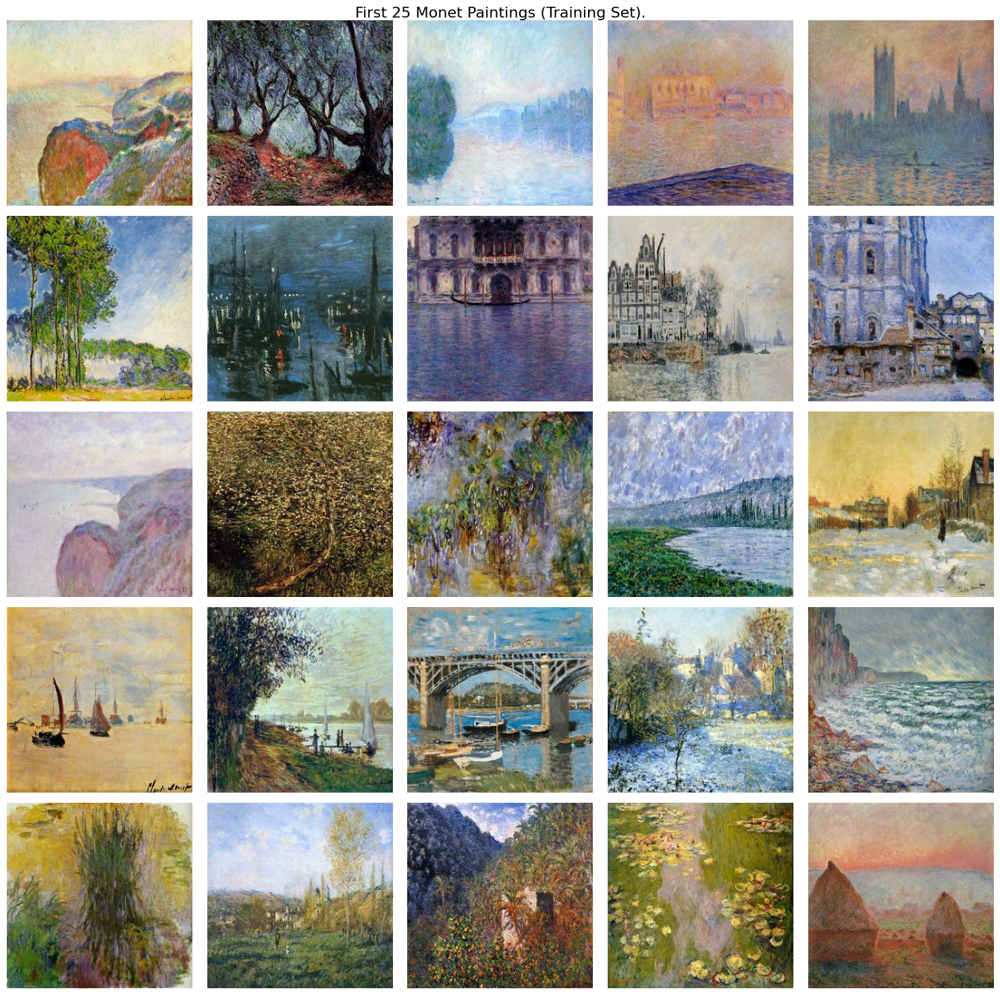

In [51]:
# Number of images to display
numImages = 25
rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
fig.suptitle("First 25 Monet Paintings (Training Set).", fontsize=16)
# Flatten axes array for easy iteration
axes = axes.flatten()

for i in range(numImages):
        imgPath = os.path.join(monetDir, imageFiles[i])
        img = Image.open(imgPath).convert('RGB')
        img = img.resize((imgWidth, imgHeight))
        axes[i].imshow(img)
        axes[i].axis('off')

plt.tight_layout()
plt.show()


These images are pictures of the real paintings. They appear to be low resolution images to the naked eye.

Let's now take a look at the pictures in the photo directory:


Line 129: Number of Photo images found: 7038

Line 143 Sample Image Name: 058af422c6.jpg

Line 144 Image shape (HxWxC): (256, 256, 3)


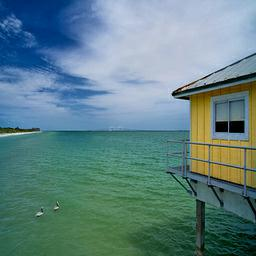

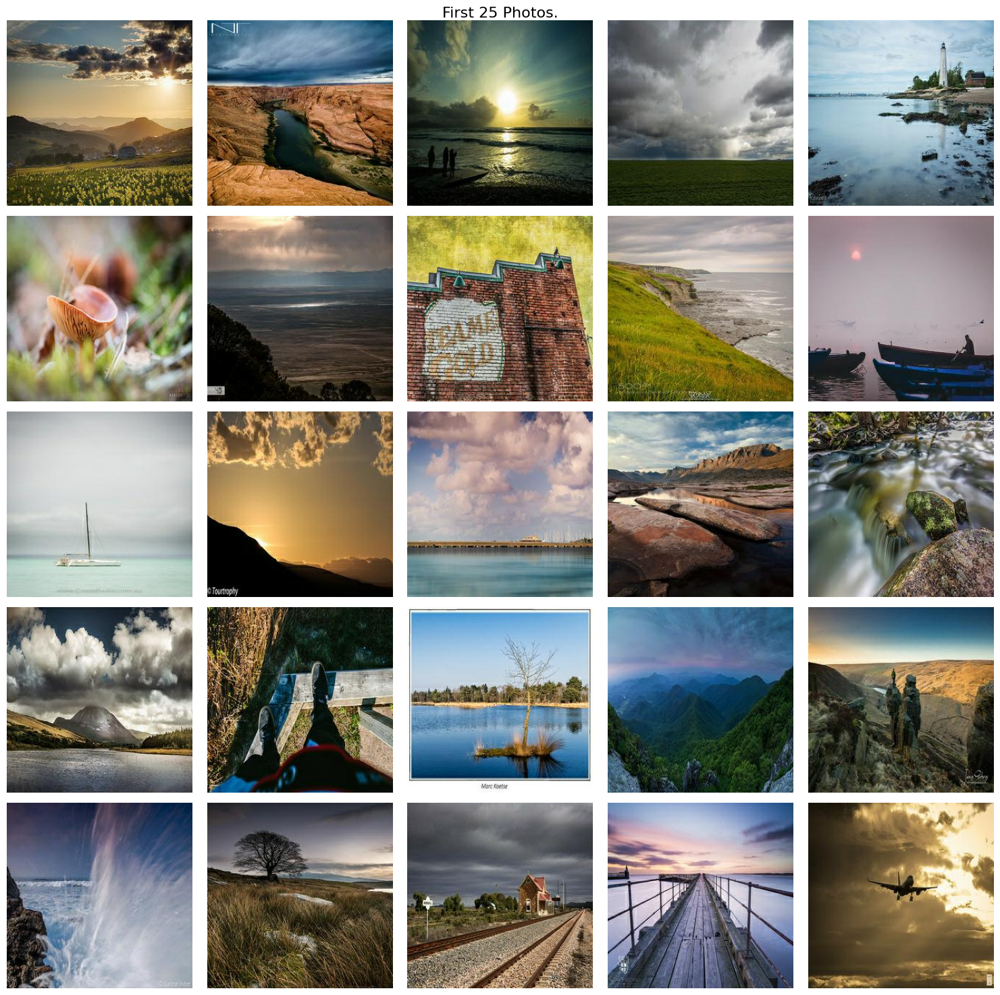

In [52]:
# Let's looks at structure and sample in the Photo directory:
# List all jpg files in photoDir
photoFiles = [f for f in os.listdir(photoDir) if f.endswith('.jpg')]

print("\nLine 129: Number of Photo images found:", len(photoFiles))

# Get a sample image of idx 150:
sampleIndex = 150
if sampleIndex < len(photoFiles):
        samplePhotoName = photoFiles[sampleIndex]
        samplePhotoPath = os.path.join(photoDir, samplePhotoName)
        
        # Load the image
        samplePhoto = Image.open(samplePhotoPath).convert('RGB')
        samplePhoto = samplePhoto.resize((imgWidth, imgHeight))
        
        # Convert to numpy array
        sampleStructure = np.array(samplePhoto)
        print("\nLine 143 Sample Image Name:", samplePhotoName)
        print("\nLine 144 Image shape (HxWxC):" , sampleStructure.shape)
        
        display(samplePhoto)
else:
        print("\nLine 148: Sample index", sampleIndex, "is out of bounds for image list length", len(photoFiles))

# Display the first 25 photos: 
numPhotos = 25
rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
fig.suptitle("First 25 Photos.", fontsize=16)
# Flatten axes array for easy iteration
axes = axes.flatten()

for i in range(numPhotos):
        photoPath = os.path.join(photoDir, photoFiles[i])
        photo = Image.open(photoPath).convert('RGB')
        photo = photo.resize((imgWidth, imgHeight))
        axes[i].imshow(photo)
        axes[i].axis('off')

plt.tight_layout()
plt.show()





The pictures in the photo_jpg directory look very vivid, sharp and well defined. They seem to be of a much higher resolution.

<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> Cycle GAN Model Architecture: </h3>

The architecture implemented in the code represents a classical CycleGAN architecture enabling transformations between two image domains without paired training examples.
The main components are:

Two generators modeled as encoder-decoder CNNs based on strided convolutions and transpose convolutions.

Two PatchGAN discriminators that classify patches as real or fake.

Losses incorporating adversarial, cycle consistency, and identity components to enable unpaired image-to-image translation.

Training routines that alternate between updating generators and discriminators.

This CycleGAN contains four main networks:

Two Generators: Generator G translates images from domain X to domain Y, and Generator F translates images from domain Y back to domain X.
	
Two Discriminators: Discriminator X distinguishes between real images in domain X and fake images generated by F. Discriminator Y distinguishes between real images in domain Y and fake images generated by G.

The design resembles an encoder-decoder structure that first compresses the input to a lower-dimensional representation and then reconstructs the transformed image at the original resolution.

Training Components and Losses: The model optimizes two adversarial losses by training the discriminators to distinguish real and fake images from each domain.

Cycle Consistency Loss: Enforces that a translation from one domain to the other and back results in the original image, ensuring meaningful reversible mappings.

Identity Loss: Helps preserve color composition by ensuring that input images mapped back to their original domain remain unchanged. The loss functions use Mean Squared Error (MSE) for
adversarial losses and L1 norm for cycle consistency and identity losses. The training step calculates generator and discriminator losses, applies gradients, and updates model weights.



Line 124: is there a model trained?: True

Line 128: Trained Models detected. Loading model weights and skipping training.


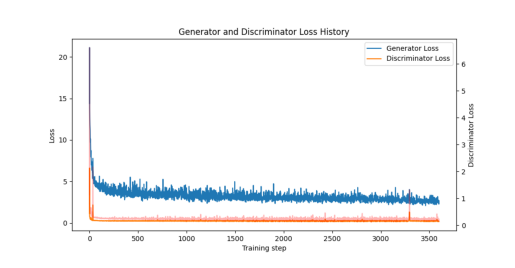


Line 272: Detected generated images already exist, skipping generation.

Line 274: Training complete. Models and images saved.


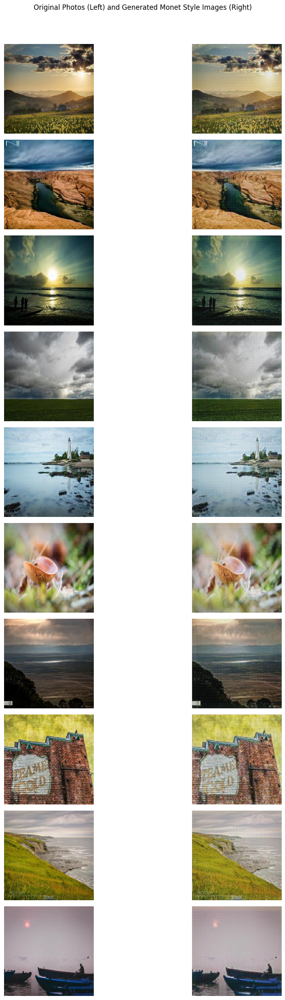


Line 283: Saved side-by-side comparison figure as comparison.png


In [56]:
def buildGenerator():
        inputs = layers.Input([imgHeight, imgWidth, imgChannels])
        x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
        x = layers.LeakyReLU()(x)
        x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Conv2DTranspose(128, 4, strides=2, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Conv2DTranspose(64, 4, strides=2, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Conv2DTranspose(imgChannels, 4, strides=2, padding='same', activation='tanh')(x)
        return tf.keras.Model(inputs=inputs, outputs=x)

def buildDiscriminator():
        inputs = layers.Input([imgHeight, imgWidth, imgChannels])
        x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
        x = layers.LeakyReLU()(x)
        x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Conv2D(1, 4, strides=1, padding='same')(x)
        return tf.keras.Model(inputs=inputs, outputs=x)

modelGPath = 'generatorG_Monet.h5'
modelFPath = 'generatorF_Photo.h5'
modelXPath = 'discriminatorX.h5'
modelYPath = 'discriminatorY.h5'

# If the model already exists on disk (because it was trained before), do not train again:
isTrained = False
if (os.path.exists(modelGPath) and 
        os.path.exists(modelFPath) and 
        os.path.exists(modelXPath) and 
        os.path.exists(modelYPath)):
        isTrained = True
print("\nLine 124: is there a model trained?:", isTrained)

if isTrained:
        print('\nLine 128: Trained Models detected. Loading model weights and skipping training.')
        generatorG = tf.keras.models.load_model(modelGPath, compile=False) #compile=False, default is True
        generatorG.compile(optimizer=Adam(2e-4, beta_1=0.5), loss=tf.keras.losses.MeanSquaredError()) #manually compile (inserted)
        
        generatorF = tf.keras.models.load_model(modelFPath, compile=False) #compile=False added
        generatorF.compile(optimizer=Adam(2e-4, beta_1=0.5), loss=tf.keras.losses.MeanSquaredError()) #manually compile (inserted)
        
        discriminatorX = tf.keras.models.load_model(modelXPath, compile=False) #compile=False added
        discriminatorX.compile(optimizer=Adam(2e-4, beta_1=0.5), loss=tf.keras.losses.MeanSquaredError()) #manually compile (inserted)
        
        discriminatorY = tf.keras.models.load_model(modelYPath, compile=False) #compile=False added
        discriminatorY.compile(optimizer=Adam(2e-4, beta_1=0.5), loss=tf.keras.losses.MeanSquaredError()) #manually compile (inserted)
        
        # No training required
        gHistory = []
        dHistory = []
else: # training required. This is the training script:
        generatorG = buildGenerator()
        generatorF = buildGenerator()
        discriminatorX = buildDiscriminator()
        discriminatorY = buildDiscriminator()
        gOptimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        fOptimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        dXOptimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        dYOptimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        lossObj = tf.keras.losses.MeanSquaredError()
        lambdaCycle = 10
        # HISTORY TRACKING
        gHistory = []
        dHistory = []
        def discriminatorLoss(real, generated):
                realLoss = lossObj(tf.ones_like(real), real)
                generatedLoss = lossObj(tf.zeros_like(generated), generated)
                return (realLoss + generatedLoss) * 0.5
        def generatorLoss(generated):
                return lossObj(tf.ones_like(generated), generated)
        def cycleConsistencyLoss(real, cycled):
                return tf.reduce_mean(tf.abs(real - cycled)) * lambdaCycle
        def identityLoss(real, same):
                return tf.reduce_mean(tf.abs(real - same)) * (lambdaCycle * 0.5)
        
        @tf.function
        def trainStep(realX, realY):
                with tf.GradientTape(persistent=True) as tape:
                        fakeY = generatorG(realX, training=True)
                        cycledX = generatorF(fakeY, training=True)
                        fakeX = generatorF(realY, training=True)
                        cycledY = generatorG(fakeX, training=True)
                        sameX = generatorF(realX, training=True)
                        sameY = generatorG(realY, training=True)
                        discRealX = discriminatorX(realX, training=True)
                        discRealY = discriminatorY(realY, training=True)
                        discFakeX = discriminatorX(fakeX, training=True)
                        discFakeY = discriminatorY(fakeY, training=True)
                        genGLoss = generatorLoss(discFakeY)
                        genFLoss = generatorLoss(discFakeX)
                        totalCycleLoss = cycleConsistencyLoss(realX, cycledX) + cycleConsistencyLoss(realY, cycledY)
                        totalGenGLoss = genGLoss + totalCycleLoss + identityLoss(realY, sameY)
                        totalGenFLoss = genFLoss + totalCycleLoss + identityLoss(realX, sameX)
                        discXLoss = discriminatorLoss(discRealX, discFakeX)
                        discYLoss = discriminatorLoss(discRealY, discFakeY)
                gGradients = tape.gradient(totalGenGLoss, generatorG.trainable_variables)
                fGradients = tape.gradient(totalGenFLoss, generatorF.trainable_variables)
                dxGradients = tape.gradient(discXLoss, discriminatorX.trainable_variables)
                dyGradients = tape.gradient(discYLoss, discriminatorY.trainable_variables)
                gOptimizer.apply_gradients(zip(gGradients, generatorG.trainable_variables))
                fOptimizer.apply_gradients(zip(fGradients, generatorF.trainable_variables))
                dXOptimizer.apply_gradients(zip(dxGradients, discriminatorX.trainable_variables))
                dYOptimizer.apply_gradients(zip(dyGradients, discriminatorY.trainable_variables))
                return totalGenGLoss, discYLoss
        
        startTrain = time.time()
        print("\nLine 184: Start training.")
        for epoch in range(epochs):
                startep = time.time()
                print("\nLine 187: Epoch", (epoch+1), "of", epochs)
                for realX, realY in zip(photoDataset, monetDataset):
                        gLoss, dLoss = trainStep(realX, realY)
                        gHistory.append(float(gLoss))
                        dHistory.append(float(dLoss))
                endep = time.time()
                print("\nLine 193: Epoch", (epoch+1), "of", epochs, round(endep-startep,0), "sec.")
        endTrain = time.time()
        print("\nLine 195: Epochs", epochs, round(endTrain-startTrain,0), "sec.")
        
        # PLOT LOSSES (generator: primary y-axis, discriminator: secondary y-axis)
        plt.figure(figsize=(10,5))
        plt.plot(gHistory, label='Generator Loss')
        plt.plot(dHistory, label='Discriminator Loss')
        plt.ylabel('Loss')
        plt.xlabel('Training step')
        plt.legend(loc='upper right')
        plt.twinx()
        plt.plot(dHistory, color='r', alpha=0.3)
        plt.ylabel('Discriminator Loss')
        plt.title('Generator and Discriminator Loss History')
        plt.savefig('loss_plot.png')
        plt.show()
        plt.close()
        # Save models
        generatorG.save(modelGPath)
        generatorF.save(modelFPath)
        discriminatorX.save(modelXPath)
        discriminatorY.save(modelYPath)

if os.path.exists('loss_plot.png'):
        img = Image.open('loss_plot.png')
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.show()
else:
        print("loss_plot.png does not exist.")


# Generate images and save to zip
outputDir = os.path.join(dataDir, "generatedImages")
os.makedirs(outputDir, exist_ok=True)

# Check if generatedImages has any jpg files; skip generation if so
generatedImageFiles = glob.glob(os.path.join(outputDir, '*.jpg'))

if len(generatedImageFiles) == 0:
        photoPaths = glob.glob(os.path.join(photoDir, '*.jpg')) # no sort, original filesystem order
        for idx, path in enumerate(photoPaths):
                print("\nLine 227: idx", idx, "path:", path)
                img = loadImage(path)
                imgTensor = tf.expand_dims(img, 0)
                generated = generatorG(imgTensor, training=False)
                outImg = (generated[0].numpy() + 1) * 127.5
                outImg = np.clip(outImg, 0, 255).astype('uint8')
                outPIL = Image.fromarray(outImg)
                #tempFilename = f'/monet_{idx:04d}.jpg'
                tempFilename = os.path.basename(path)
                #outPIL.save(f'{outputDir}{tempFilename}')
                #outPIL.save(f'{outputDir}/monet_{idx:04d}.jpg')
                outPIL.save(os.path.join(outputDir, tempFilename))
                print("\nLine 234: tempFilename", tempFilename, "saved.")

        with zipfile.ZipFile('images.zip', 'w') as zipf:
                for imgName in os.listdir(outputDir):
                        zipf.write(os.path.join(outputDir, imgName), arcname=imgName)
else:
        print("\nLine 272: Detected generated images already exist, skipping generation.")

print("\nLine 274: Training complete. Models and images saved." )

# Display side by side first 10 images from photo_jpg and generatedImages:
numDisplay = 10
photoPaths = glob.glob(os.path.join(photoDir, '*.jpg'))[:numDisplay]
generatedPaths = [os.path.join(outputDir, os.path.basename(p)) for p in photoPaths]

plt.figure(figsize=(12, 5 * numDisplay // 2))

for i, (photoPath, genPath) in enumerate(zip(photoPaths, generatedPaths)):
        # Load images
        photoImg = Image.open(photoPath).convert('RGB')
        genImg = Image.open(genPath).convert('RGB')
        
        # Photo column (left)
        plt.subplot(numDisplay, 2, 2 * i + 1)
        plt.imshow(photoImg)
        plt.axis('off')
        
        # Generated column (right)
        plt.subplot(numDisplay, 2, 2 * i + 2)
        plt.imshow(genImg)
        plt.axis('off')

plt.suptitle('Original Photos (Left) and Generated Monet Style Images (Right)')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('comparison.png')
plt.show()
plt.close()
print("\nLine 283: Saved side-by-side comparison figure as comparison.png")




Given the sheer amount of time the model takes to train, I took steps to refer to the results once the training was completed (after an overnight run of 8 hours) on my CPU. 
I saved the model in .h5 files, and the average loss for both generators and discriminators in a .png file. Thus, the model trains and fits once, and can be retrieved to be adjusted further.

<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> Performance of the Cycle GAN model: </h3>
The original pictures look very nitid with well defined colors and lines, whereas the generated images look of a lower resolution, less sharp, more blur, with shapes and colors less defined. This is to the naked eye of a non expert. To make this Cycle GAN more convincing in its capability to transform pictures into Monet-style, I would train longer, with more CNN layers, and with more input data, although finding more input data may be challenging since there is a finite number of Monet paintings available.

On the technical side, generators and discriminators average losses are stable after 8 hours of training, significantly lower than the the beginning of the training, but still trending down. This suggests that a larger number of epochs (now 120 for 8 hours) may well help.

<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> Hyperparameter Tuning and Future Improvements: </h3>

Learning Rates: I used a learning rate of 0.0002 for both generators and discriminators. A future iteration of the tuning would separate learning for the generators and discriminators. Typical initial values are around 0.0001 to 0.0002 for generators and sometimes lower for discriminators (0.00005).
Learning rate scheduling such as linear decay after some epochs is often used to stabilize training.

Batch Size: this model is tuned with a batch size of 10. Small batch sizes (like 1 or 4) are commonly used in GAN training due to memory constraints and improved stability. Batch size impacts training stability and convergence speed. Larger batches give smoother gradients but require more memory. I will most likely try a batch size of 5 in the next iteration.

Cycle Consistency Loss Weight (λCycle): The model is tuned with a lambda cycle of 10. This parameter balances the importance of cycle consistency loss relative to adversarial loss. Common values range from 10 to 15, emphasizing preserving content during translation. I will increase to 12 in the next iteration.
	
Identity Loss Weight: this parameter encourages generators to preserve color composition when input images are from the target domain. This model is set to 1/2 of lambda cycle, and I will increase it to 0.7 in the next iteration. 

	
Discriminator Architecture and Patch Size: usually PatchGAN discriminators classify patches progressively rather than the whole image. This model is tuned with a Patch sizes of 70x70. The  discriminator uses four convolutional layers with kernel size 4 and strides mostly 2 (except the last convolution which has stride 1). Starting from input image size 256×256, after progressive downsampling by strides of 2, the receptive field of the discriminator covers 70×70 patches.

	
Optimizer Parameters: This model's Adam optimizer uses moving averages to adaptively scale the learning rates per parameter. The model is tuned with β1=0.5, equally for generators and discriminators. I did not modify the default β2 usually set at 0.999. 
β2 is called the exponential decay rate for the second moment estimates (the moving average of the squared gradients). It controls how quickly the optimizer "forgets" past squared gradients. A value close to 1 (like 0.999) means it retains long-term memory of past squared gradients, smoothing the variance estimate.
I will fine tune it in future iterations.

Number of Training Epochs: this model was tuned with 120 epochs (8 hours of overnight training). While the model achieves stability, the losses are still show a downward trend which justifies taking a further look at increased epochs.




<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> MiFID metrics: </h3>
PyTorch is able compute MiFID and the score for this model is 26.08. The ultimate measure is the one computed by Kaggle, which may differ from PyTorch's. While there is no public information about the relative difference between the two MiFIDs, the score result is encouraging and simply means that it is probably worth giving this model a new round of tuning. I have saved the computed MiFID in a file for future retrieval after training.

In [64]:
#================================================================
# MiFID metrics:
#=================================================================
print("\nLine 293: Metrics Evaluation.")

metricFilePath = os.path.join(dataDir, 'mifid_score.txt')

if os.path.exists(metricFilePath):
        with open(metricFilePath, 'r') as metricFile:
                mifidScoreValue = float(metricFile.read().strip())
        print(f"\nLine 314 MiFID score loaded from file: {mifidScoreValue:.2f}")
else:
        print("\nLine 316: Image conversion to Torch Tensor.")
        imgTransform = transforms.Compose([
                transforms.Resize((299, 299)),
                transforms.ToTensor(), #Converts to float tensor (0.0-1.0)
                transforms.Lambda(lambda x: (x * 255).to(torch.uint8)) #Convert to uint8 [0,255]
        ])
        
        print("\nLine 323:  Initialize MiFID metric.")
        mifidMetric = MemorizationInformedFrechetInceptionDistance()
        
        print("\nLine 326:  Collect paths for real and generated images (should match in count & order)")
        realImagePaths = glob.glob(os.path.join(photoDir, '*.jpg'))
        genImagePaths = [os.path.join(outputDir, os.path.basename(p)) for p in realImagePaths]
        
        print("\nLine 330:  Update metric with real images")
        realCounter = 0
        for realPath in realImagePaths:
                imgPIL = Image.open(realPath).convert('RGB')
                imgTorch = imgTransform(imgPIL).unsqueeze(0) # Add batch dim
                mifidMetric.update(imgTorch, real=True)
                realCounter+=1
                if( realCounter % 100 == 0):
                        print("\nLine 338: realCounter=", realCounter, "of", len(realImagePaths))
        
        print("\nLine 332: Update metric with generated images")
        genCounter = 0
        for genPath in genImagePaths:
                imgPIL = Image.open(genPath).convert('RGB')
                imgTorch = imgTransform(imgPIL).unsqueeze(0) # Add batch dim
                mifidMetric.update(imgTorch, real=False)
                genCounter+=1
                if( genCounter % 100 == 0):
                        print("\nLine 348: genCounter=", genCounter, "of", len(genImagePaths))
        
        mifidScoreTensor = mifidMetric.compute()
        mifidScoreValue = mifidScoreTensor.item()
        print(f"\nLine 352 MiFID score evaluating generated Monet-style images: {mifidScoreValue:.2f}")
        
        # Save metric value to file for reuse
        with open(metricFilePath, 'w') as metricFile:
                metricFile.write(f"{mifidScoreValue:.6f}")



Line 293: Metrics Evaluation.

Line 314 MiFID score loaded from file: 26.08


<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> .zip file deliverable: </h3>


In [81]:
zipFileName = 'images.zip'
print("\nLine 459: Zip file name:", zipFileName)

with zipfile.ZipFile(zipFileName, 'r') as archive:
        jpgFiles = [info for info in archive.infolist() if info.filename.lower().endswith('.jpg')]
        numJpg = len(jpgFiles)
        print("\nLine 464: Number of .jpg files inside:", numJpg)
        totalBytes = sum(info.file_size for info in jpgFiles)
        totalMb = totalBytes / 1024 / 1024
        print("\nLine 467: Total .jpg size (MB):", round(totalMb, 2))
        print("\nLine 468: First 10 .jpg file names:", 
              "\nThese are generated photos through the trained cycle GAN.",
              "\nThe name of the file is the same as the original photo file which the GAN modified.", 
              "\nI intentionally made the file name the same for easy retrieval and comparison.\n")
        for info in jpgFiles[:10]:
                print(info.filename)



Line 459: Zip file name: images.zip

Line 464: Number of .jpg files inside: 7038

Line 467: Total .jpg size (MB): 92.61

Line 468: First 10 .jpg file names: 
These are generated photos through the trained cycle GAN. 
The name of the file is the same as the original photo file which the GAN modified. 
I intentionally made the file name the same for easy retrieval and comparison.

00068bc07f.jpg
000910d219.jpg
000ded5c41.jpg
00104fd531.jpg
001158d595.jpg
0033c5f971.jpg
0039ebb598.jpg
003aab6fdd.jpg
003c6c30e0.jpg
00479e2a21.jpg


<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> Conclussions: </h3>
While there is plenty of room for improvement in this initial model, this cycle GAN accomplishes the task it was designed to perform: transform a photo into a Monet styled picture. It does so with a CPU computed PyTorch MiFID score of 26.08 , which could be (loosely) compared to Kaggle's MiFID currently at around 34.

https://www.kaggle.com/competitions/gan-getting-started/leaderboard?

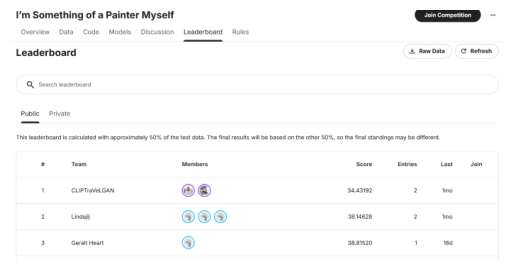

In [68]:
kaggleMiFID = Image.open('kaggleMiFID.png')
plt.imshow(kaggleMiFID)
plt.axis('off')  # Hide axes
plt.show()


<h3 style="font-weight: bold; font-style: italic; text-decoration: underline;"> References: </h3>

https://www.kaggle.com/competitions/gan-getting-started

https://www.kaggle.com/code/chenshiri/monetcyclegan

https://github.com/ym59/MonetGAN

https://github.com/stevensmiley1989/Monet_GAN/blob/main/Week5_Assignment_r1.ipynb

https://github.com/annasanders

https://github.com/KenMcCarthy24/DTSA_5511_Monet_GAN

https://www.tensorflow.org/tutorials/generative/dcgan

